# PEC 3 DISEÑO E IMPLEMENTACIÓN DEL TRABAJO

## TFM GESTIÓN AVANZADA DE INVENTARIO. Machine Learning aplicado a la predicción de la demanda.  

### 3 Diseño modelos de predicción

Se han completado las primeras fases de preparación del fichero, análisis estadístico y temporal, y por último reducción de la dimensionalidad.  
Se aborda en este apartado, el diseño de un modelo de predicción de unidades de venta, a partir de algoritmos Machine learning.   

In [2]:
# Carga de librerías.

import numpy as np 
import pandas as pd
import seaborn as sns
import datetime
from datetime import datetime, timedelta
from pandas import DataFrame, Timestamp

from sklearn import datasets
from sklearn import preprocessing 
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, classification_report, mean_absolute_error, mean_squared_error
from sklearn.metrics import accuracy_score, recall_score, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.svm import SVC, SVR
from sklearn.tree import DecisionTreeClassifier, export_graphviz, DecisionTreeRegressor
from sklearn.utils import check_random_state
from scipy import stats
from scipy.stats import norm

# Visualizar árboles
from IPython.display import Image
import pydotplus
from six import StringIO

# UMAP para la reducción de dimensionalidad
# import umap

# Visualización
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

# visualizar heatmap
import seaborn as sn

# Validación cruzada
from sklearn.model_selection import StratifiedKFold

# Redes neuronales
import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Activation, Flatten, Input
from keras.optimizers import Adam, SGD, Adadelta, Adagrad

%matplotlib inline

In [3]:
# Eliminación de los límites para visualización.

pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [33]:
# Lectura del fichero depurado y limpio.
# Indexar por variable 'date'

venta = pd.read_excel('data/venta_log3.xls')
venta = venta.set_index('date')
# venta.sort_index()
venta = venta.drop(columns = ['Unnamed: 0'], axis=1)

# Se eliminan las filas creadas por hueco en fecha.

venta = venta.drop(venta[venta['fecha']==1].index, axis = 0)

In [34]:
venta.head()

,sku,fecha,udsVenta,bolOpen,bolPromo,udsStock,day,week_year,1_x,2_x,3_x,4_x,5_x,6_x,7_x,1,2,3,4,5,6,7,8,9,10,11,12,2020,2021,2022,bol_weekfirst,bol_weeklast,udsVentalog,bol_festivo,bol_puente,bol_week_prev1,bol_week_prev2,bol_week_post1,bol_week_post2,bol_day_prev1,bol_day_prev2,bol_day_post1,bol_day_post2,bol_summer1q,bol_summer2q,bol_summer3q,bol_summer4q
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-05-19 00:00:00,1,20200519,35,1,0,441,19,21,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.583519,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-05-20 00:00:00,1,20200520,28,1,0,406,20,21,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-05-21 00:00:00,1,20200521,63,1,0,378,21,21,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,4.158883,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-05-22 00:00:00,1,20200522,42,1,0,315,22,21,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.761200,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-05-23 00:00:00,1,20200523,28,1,0,273,23,21,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [35]:
print ('Dimensión del fichero venta {}.'.format(venta.shape))

Dimensión del fichero venta (32181, 47).


### 3.1 Discretizar variable objetivo udsVenta
Los algoritmos de Machine Learning, funcionan mejor en problemas de clasificación, donde la variable objetivo es discreta. En este ejercicio, la variable objetivo udsVenta es continua y debe transformarse en continua. Se discretiza según criterio de tamaño o frecuencia.   

#### 3.1.1 Discretización en 7 intervalos de igual longitud.   
Se crean rangos de manera que cada intervalo represente el mismo número de valores. 

In [36]:
print('El valor máximo de udsVenta es {} y el mínimo {}.'. format(venta['udsVenta'].max(), venta['udsVenta'].min()))

El valor máximo de udsVenta es 196 y el mínimo 0.


El valor máximo de la variable udsVenta es 196 y el mínimo 0. Se reparte el rango de valores, en 7 intervalos de igual tamaño.  

In [37]:
venta['udsVenta_cat'] = pd.cut(venta.udsVenta, bins=7, labels=np.arange(7), right=False)

In [38]:
venta['udsVenta_cat'].describe()

count     32181
unique        7
top           0
freq      25823
Name: udsVenta_cat, dtype: int64

In [39]:
freq_cat = venta['udsVenta_cat'].value_counts()
freq_cat

0    25823
1     5413
2      776
3      134
4       27
5        6
6        2
Name: udsVenta_cat, dtype: int64

La distribución de clases está muy sesgada hacia la derecha. El 81% de las observaciones corresponde a la clase 0.  
Se prueba con 14 intervalos.  

#### 3.1.2 Discretización en 14 intervalos de igual longitud.   
Se amplía el número de intervalos a 14, que también es múltiplo de 196.

In [40]:
venta['udsVenta_cat2'] = pd.cut(venta.udsVenta, bins=14, labels=np.arange(14), right=False)

In [41]:
venta['udsVenta_cat2'].describe()

count     32181
unique       12
top           0
freq      16998
Name: udsVenta_cat2, dtype: int64

In [42]:
freq_cat = venta['udsVenta_cat2'].value_counts()
freq_cat

0     16998
1      8825
2      3895
3      1518
4       551
5       225
6        99
7        35
8        18
9         9
10        6
13        2
12        0
11        0
Name: udsVenta_cat2, dtype: int64

El intervalo 0, acumula el 55% de las observaciones

#### 3.1.3 Discretización por valores de _udsVenta_ (clases).   
Vease un segundo método de discretización consistente en crear intervalos para cada uno de los valores de la variable udsVenta.   

In [43]:
freq = venta['udsVenta'].value_counts()
freq

0      11096
7       5902
14      5058
21      3767
28      2396
35      1499
42       948
49       570
56       342
63       209
70       135
77        90
84        60
91        39
98        21
105       14
112       10
119        8
126        7
147        3
140        3
133        2
196        1
182        1
Name: udsVenta, dtype: int64

In [44]:
freq_log = venta['udsVentalog'].value_counts()
freq_log

0.000000    11096
2.079442     5902
2.708050     5058
3.091042     3767
3.367296     2396
3.583519     1499
3.761200      948
3.912023      570
4.043051      342
4.158883      209
4.262680      135
4.356709       90
4.442651       60
4.521789       39
4.595120       21
4.663439       14
4.727388       10
4.787492        8
4.844187        7
4.948760        3
4.997212        3
4.897840        2
5.283204        1
5.209486        1
Name: udsVentalog, dtype: int64

El valor de venta = 0 es el 32,74% de las observaciones. Sólo interesa incorporar al estudio aquellas observaciones en las que el valor de venta = 0, estando abierto el establecimiento. Por tanto, vease cómo resultaría el reparto de frecuencias para unidades de venta, cuando el establecimiento está abierto _bolOpen_ = 1.  

In [45]:
venta_open = venta[venta['bolOpen']==1]
freq_open = venta_open['udsVenta'].value_counts()
freq_open

0      6934
7      5896
14     5053
21     3766
28     2396
35     1499
42      947
49      569
56      341
63      209
70      135
77       90
84       60
91       39
98       21
105      14
112      10
119       8
126       7
147       3
140       3
133       2
196       1
182       1
Name: udsVenta, dtype: int64

Se han descartado un total de 4.177 observaciones en las que el establecimiento está cerrado. Ahora, el valor de ventas = 0, representa el 23,33% del total.  

In [46]:
# Ordenado por valores de venta

freq_open.sort_index()

0      6934
7      5896
14     5053
21     3766
28     2396
35     1499
42      947
49      569
56      341
63      209
70      135
77       90
84       60
91       39
98       21
105      14
112      10
119       8
126       7
133       2
140       3
147       3
182       1
196       1
Name: udsVenta, dtype: int64

Hay un total de 25 valores distintos en _udsVenta_. Se crea variable clase para cada valor de _udsVenta_. Todos son multiplos de 7, excepto 1. Se asigna clase a la variable _udsVenta_class_.

In [47]:
clas = venta['udsVenta'].unique().tolist()
clas.sort()
K = range (0, len(clas))

venta = venta.reset_index()
venta['udsVenta_clas'] = 0
j=0

table = pd.DataFrame(columns =('udsVenta', 'clas'))

for k in K:
    c = clas[k]
    V = venta.index[venta['udsVenta'] == c].tolist()
    venta.at[V, 'udsVenta_clas'] = j
    table.loc[k,'udsVenta'] = c
    table.loc[k, 'clas'] = j
    j=j+1

venta = venta.set_index('date')    

In [48]:
# Tabla con asignación de clases a la variable udsVenta.

table.astype('int32')

,udsVenta,clas
0,0,0
1,7,1
2,14,2
3,21,3
4,28,4
5,35,5
6,42,6
7,49,7
8,56,8
9,63,9


Este método de discretización no es representativo de todos los posibles valores de la variable _udsVenta_, dado que no contempla los valores (154, 161, 168, 175, 189). En cambio, tiene la ventaja que separa el valor _udsVenta = 1_, del primer rango, y reduce la concentración del valor 0.   

In [49]:
# Cambiar categoría a la nueva variable.

venta['udsVenta_clas'] = venta['udsVenta_clas'].astype('category')
venta.dtypes

sku                  int64
fecha                int64
udsVenta             int64
bolOpen              int64
bolPromo             int64
udsStock             int64
day                  int64
week_year            int64
1_x                  int64
2_x                  int64
3_x                  int64
4_x                  int64
5_x                  int64
6_x                  int64
7_x                  int64
1                    int64
2                    int64
3                    int64
4                    int64
5                    int64
6                    int64
7                    int64
8                    int64
9                    int64
10                   int64
11                   int64
12                   int64
2020                 int64
2021                 int64
2022                 int64
bol_weekfirst        int64
bol_weeklast         int64
udsVentalog        float64
bol_festivo          int64
bol_puente           int64
bol_week_prev1       int64
bol_week_prev2       int64
b

In [50]:
# Nuevo fichero para días que está abierto y categoría por rango de unidades vendidas.

venta.head()

,sku,fecha,udsVenta,bolOpen,bolPromo,udsStock,day,week_year,1_x,2_x,3_x,4_x,5_x,6_x,7_x,1,2,3,4,5,6,7,8,9,10,11,12,2020,2021,2022,bol_weekfirst,bol_weeklast,udsVentalog,bol_festivo,bol_puente,bol_week_prev1,bol_week_prev2,bol_week_post1,bol_week_post2,bol_day_prev1,bol_day_prev2,bol_day_post1,bol_day_post2,bol_summer1q,bol_summer2q,bol_summer3q,bol_summer4q,udsVenta_cat,udsVenta_cat2,udsVenta_clas
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-05-19,1,20200519,35,1,0,441,19,21,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.583519,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,5
2020-05-20,1,20200520,28,1,0,406,20,21,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4
2020-05-21,1,20200521,63,1,0,378,21,21,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,4.158883,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,4,9
2020-05-22,1,20200522,42,1,0,315,22,21,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.761200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,6
2020-05-23,1,20200523,28,1,0,273,23,21,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4


### 3.2 Reducción fichero para días con establecimiento abierto (_bolOpen = 1_).  
Se encuentran razones por las que pensar que los días que establecimiento está cerrado, no aporta información relevante al fichero. En estos días el volumen de ventas es 0.  

In [51]:
venta2 = venta[venta['bolOpen']==1]

In [52]:
venta2.head()

,sku,fecha,udsVenta,bolOpen,bolPromo,udsStock,day,week_year,1_x,2_x,3_x,4_x,5_x,6_x,7_x,1,2,3,4,5,6,7,8,9,10,11,12,2020,2021,2022,bol_weekfirst,bol_weeklast,udsVentalog,bol_festivo,bol_puente,bol_week_prev1,bol_week_prev2,bol_week_post1,bol_week_post2,bol_day_prev1,bol_day_prev2,bol_day_post1,bol_day_post2,bol_summer1q,bol_summer2q,bol_summer3q,bol_summer4q,udsVenta_cat,udsVenta_cat2,udsVenta_clas
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-05-19,1,20200519,35,1,0,441,19,21,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.583519,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,5
2020-05-20,1,20200520,28,1,0,406,20,21,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4
2020-05-21,1,20200521,63,1,0,378,21,21,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,4.158883,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,4,9
2020-05-22,1,20200522,42,1,0,315,22,21,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.761200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,6
2020-05-23,1,20200523,28,1,0,273,23,21,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4


In [53]:
freq_sku = venta_open.groupby(['sku', 'udsVenta']).size()
freq_sku

sku  udsVenta
1    0            82
     7            21
     14           33
     21           49
     28           62
     35           55
     42           61
     49           36
     56           44
     63           29
     70           22
     77           11
     84           15
     91            5
     98            3
     105           3
     119           1
     126           3
     133           1
     147           1
     196           1
2    0            19
     7            19
     14           36
     21           44
     28           50
     35           48
     42           57
     49           63
     56           40
     63           36
     70           33
     77           24
     84           13
     91           15
     98           11
     105           6
     112           6
     119           5
     126           3
     140           1
     147           2
     182           1
3    0           135
     7            63
     14           65
     21           77

### 3.3 Conjuntos train y test
Se separan los ficheros, 80% conjunto train y 20% conjunto test.  

In [54]:
# Conjunto train con 542 observaciones que equivale al 80%.

print('Fecha máxima para fichero train {}.'.format(venta.iloc[519,1]))

Fecha máxima para fichero train 20211114.


In [55]:
# Duplicar la variable sku, y añadirla como índice del fichero venta
venta['id'] = venta['sku']
venta = venta.set_index('id', append=True)

In [56]:
# Duplicar la variable sku, y añadirla como índice del fichero venta2
venta2['id'] = venta2['sku']
venta2= venta2.set_index('id', append=True)

In [57]:
# Conjunto train y test para todo el fichero

train = venta.loc[venta['fecha']<= 20211021]
test = venta.loc[venta['fecha']> 20211021]

train2 = venta2.loc[venta2['fecha']<= 20211021]
test2 = venta2.loc[venta2['fecha']> 20211021]

In [58]:
train.head()

,,sku,udsVenta,bolOpen,bolPromo,udsStock,day,week_year,1_x,2_x,3_x,4_x,5_x,6_x,7_x,1,2,3,4,5,6,7,8,9,10,11,12,2020,2021,2022,bol_weekfirst,bol_weeklast,udsVentalog,bol_festivo,bol_puente,bol_week_prev1,bol_week_prev2,bol_week_post1,bol_week_post2,bol_day_prev1,bol_day_prev2,bol_day_post1,bol_day_post2,bol_summer1q,bol_summer2q,bol_summer3q,bol_summer4q,udsVenta_cat,udsVenta_cat2,udsVenta_clas
date,id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-05-19,1,1,35,1,0,441,19,21,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.583519,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,5
2020-05-20,1,1,28,1,0,406,20,21,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4
2020-05-21,1,1,63,1,0,378,21,21,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,4.158883,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,4,9
2020-05-22,1,1,42,1,0,315,22,21,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.761200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,6
2020-05-23,1,1,28,1,0,273,23,21,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4


In [59]:
train2.head()

,,sku,udsVenta,bolOpen,bolPromo,udsStock,day,week_year,1_x,2_x,3_x,4_x,5_x,6_x,7_x,1,2,3,4,5,6,7,8,9,10,11,12,2020,2021,2022,bol_weekfirst,bol_weeklast,udsVentalog,bol_festivo,bol_puente,bol_week_prev1,bol_week_prev2,bol_week_post1,bol_week_post2,bol_day_prev1,bol_day_prev2,bol_day_post1,bol_day_post2,bol_summer1q,bol_summer2q,bol_summer3q,bol_summer4q,udsVenta_cat,udsVenta_cat2,udsVenta_clas
date,id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-05-19,1,1,35,1,0,441,19,21,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.583519,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,5
2020-05-20,1,1,28,1,0,406,20,21,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4
2020-05-21,1,1,63,1,0,378,21,21,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,4.158883,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,4,9
2020-05-22,1,1,42,1,0,315,22,21,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.761200,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3,6
2020-05-23,1,1,28,1,0,273,23,21,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,3.367296,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,4


In [60]:
print('Dimensión del fichero train {}.'.format(train.shape))
print('Dimensión del fichero test {}.'.format(test.shape))
print('El fichero train es un {}% del fichero total.'.format(round(len(train)/len(venta), 2)))

Dimensión del fichero train (25567, 49).
Dimensión del fichero test (6614, 49).
El fichero train es un 0.79% del fichero total.


In [61]:
print('Dimensión del fichero train {}.'.format(train2.shape))
print('Dimensión del fichero test {}.'.format(test2.shape))
print('El fichero train es un {}% del fichero total.'.format(round(len(train2)/len(venta_open), 2)))

Dimensión del fichero train (21993, 49).
Dimensión del fichero test (6011, 49).
El fichero train es un 0.79% del fichero total.


In [63]:
# Separación de la variable dependiente e independientes para el fichero completo.

y_train_1 = train['udsVenta']
y_train_2 = train['udsVenta_cat']
y_train_3 = train['udsVenta_clas']
y_train_4 = train['udsVenta_cat2']
x_train = train.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                'fecha','udsVenta_clas'], axis = 1)
y_test_1 = test['udsVenta']
y_test_2 = test['udsVenta_cat']
y_test_3 = test['udsVenta_clas']
y_test_4 = test['udsVenta_cat2']
x_test = test.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                              'fecha','udsVenta_clas'], axis = 1)

In [64]:
y_test_1.shape

(6614,)

In [65]:
# Separación de la variable dependiente e independientes para el fichero días abierto.

y_train2_1 = train2['udsVenta']
y_train2_2 = train2['udsVenta_cat']
y_train2_3 = train2['udsVenta_clas']
y_train2_4 = train2['udsVenta_cat2']
x_train2 = train2.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                  'fecha', 'udsVenta_clas'], axis = 1)
y_test2_1 = test2['udsVenta']
y_test2_2 = test2['udsVenta_cat']
y_test2_3 = test2['udsVenta_clas']
y_test2_4 = test2['udsVenta_cat2']
x_test2 = test2.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                'fecha', 'udsVenta_clas'], axis = 1)

In [66]:
y_test2_1.shape

(6011,)

In [23]:
# Normalización de las variables independientes en rango [0, 1]

# x_train = (x_train-x_train.min())/(x_train.max()-x_train.min())
# x_test = (x_test-x_test.min())/(x_test.max()-x_test.min())
# x_train = x_train.fillna(0)
# x_test = x_test.fillna(0)

In [73]:
# X_train = np.asarray(x_train)
# X_test = np.asarray(x_test)
# Y_train = np.asarray(y_train)
# Y_test = np.asarray(y_test)

In [67]:
# Modifica variable continua a discreta


label_encoder = LabelEncoder()
y_train_class = label_encoder.fit_transform(y_train_1)
y_test_class = label_encoder.fit_transform(y_test_1)

### 3.3 Agrupamiento por la variable sku.
Se lanza el algoritmo para cada uno de los valores de sku. Se intuye que el modelo obtenido dará mayor precisión cuando se entrena por separado por cada sku, puesto que el modelo de venta para cada uno de ellos, no necesariamente debe ser el mismo.  

In [59]:
# Separación del data set venta en sub ficheros según el valor de la variable sku.

# sku = venta['sku'].unique().tolist()
# K = range (0, len(sku))
# data_out = pd.DataFrame()
# i = 0

def sep_sku(data, sku):
    # Se separa del fichero data, las observaciones para el valor de sku.
    df = data[data['sku']==sku]
    
    # Separación de los conjuntos train y test
    dft = df.loc[df['fecha']<= 20211021]
    dfs = df.loc[df['fecha']> 20211021]
    y_train_1_sku = dft['udsVenta']
    y_train_2_sku = dft['udsVenta_cat']
    y_train_3_sku = dft['udsVenta_clas']
    y_train_4_sku = dft['udsVenta_cat2']
    x_train_sku = dft.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                'fecha', 'udsVenta_clas'], axis = 1)
    y_test_1_sku = dfs['udsVenta']
    y_test_2_sku = dfs['udsVenta_cat']
    y_test_3_sku = dfs['udsVenta_clas']
    y_test_4_sku = dfs['udsVenta_cat2']
    x_test_sku = dfs.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                              'fecha', 'udsVenta_clas'], axis = 1)
    return (y_train_1_sku, y_train_2_sku, y_train_3_sku, y_train_4_sku, x_train_sku, y_test_1_sku, 
            y_test_2_sku, y_test_3_sku, y_test_4_sku, x_test_sku)


### 3.4 Algoritmos Machine Learning.
Vease en este apartado cada uno de los algoritmos, aplicados al data set venta, y a cada uno de los subficheros obtenidos por agrupamiento de la variable sku.

#### 3.4.1 Modelo Gausiano  
Se entrena el modelo para el conjunto de todos los días, y variable _udsVenta_ categorizada.

In [183]:
# Implementación clasificador Gaussian Naïve Bayes
model_bayes = GaussianNB()
model_bayes.fit(x_train2, y_train2_2)

GaussianNB()

In [188]:
# Precisión sobre train y test
score_train = model_bayes.score(x_train2, y_train2_2)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_bayes.score(x_test2, y_test2_2)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

El grado de precisión del modelo para el conjunto train es 0.2627.
El grado de precisión del modelo para el conjunto test es 0.552.


In [184]:
# Predicción del modelo
train_preds = model_bayes.predict(x_train2)
test_preds = model_bayes.predict(x_test2)

#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(train_preds, y_train2_2))
print('RMSE in train:', np.sqrt(mean_squared_error(train_preds, y_train2_2)))
print('MAE in test:', mean_absolute_error(test_preds, y_test2_2))
print('RMSE in test:', np.sqrt(mean_squared_error(test_preds, y_test2_2)))


MAE in train: 1.4351164360445494
RMSE in train: 1.9439496555329587
MAE in test: 0.5914157378140077
RMSE in test: 1.0822904048264055


In [185]:
# Precisión, recall y f1 del modelo en conjunto train y test

accuracy_train = accuracy_score(y_train2_2, train_preds, normalize = True)
accuracy_test = accuracy_score(y_test2_2, test_preds, normalize = True)
print('Accuracy train: {}, Accuracy test: {}'.format(round(accuracy_train, 4), round(accuracy_test, 4)))

recall_train = recall_score(y_train2_2, train_preds, average= 'weighted')
recall_test = recall_score(y_test2_2, test_preds, average= 'weighted')
print('Recall train: {}, Recall test: {}'.format(round(recall_train, 4), round(recall_test, 4)))

f1_train = f1_score(y_train2_2, train_preds, average= 'weighted')
f1_test = f1_score(y_test2_2, test_preds, average= 'weighted')
print('F1 train: {}, F1 test: {}'.format(round(f1_train, 4), round(f1_test, 4)))

Accuracy train: 0.2627, Accuracy test: 0.552
Recall train: 0.2627, Recall test: 0.552
F1 train: 0.3421, F1 test: 0.5784


C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


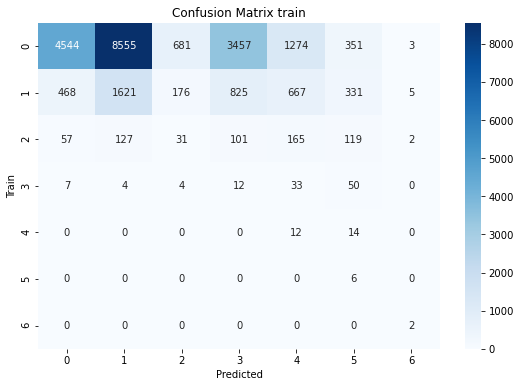

In [186]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train2_2, train_preds, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_SVCtrain2_3.jpg')
plt.show()

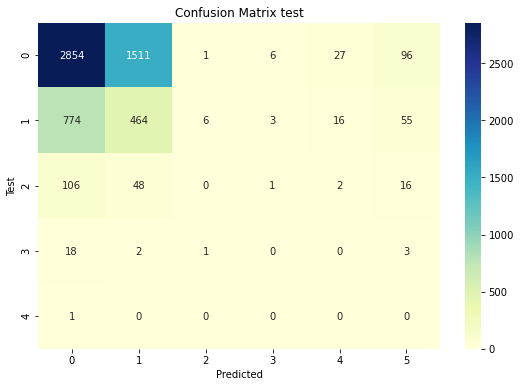

In [187]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test2_2, test_preds, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_SVCtest2_3.jpg')
plt.show()

#### 3.4.2 Modelo SVM
Se aborda en este apartado el algoritmo SVM, para las siguientes configuraciones;    

  - Variable _udsVenta_ como variable cuantitativa.
  - Discretiza en 7 intervalos de igual tamaño (fichero sufijo 2).
  - Discretiza en 25 clases que corresponde a los valores de sku (fichero sufijo 3).
  - Discretiva en 14 intervalos de igual tamaño (fichero sufijo 4).

##### 3.4.2.1 Configuración de parámetros de modelo SVM para valor determinado de sku.
Se busca la mejor configuración de parámetros para el modelo SVM, especialmente el kernel óptimo (lineal, logarítmico o polinomial). Aplicar GridSearchCV a todo el fichero pero demora mucho tiempo. Se decide configurar para una partición del fichero, para valor aleatorio de sku. 

In [31]:
df = venta[venta['sku']==23]

# Separación de los conjuntos train y test
dft = df.loc[df['fecha']<= 20211021]
dfs = df.loc[df['fecha']> 20211021]

y_train_4_sku = dft['udsVenta_cat2']
x_train_sku = dft.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                  'fecha', 'udsVenta_clas'], axis = 1)

y_test_4_sku = dfs['udsVenta_cat2']
x_test_sku = dfs.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                 'fecha', 'udsVenta_clas'], axis = 1)

In [33]:
# Definición de los conjuntos parámetro
kernel = ['linear', 'poly', 'rbf']
C = [2, 5, 10, 15]
cache_size = [100, 300, 500, 800]

grid_tree = dict(kernel=kernel, C=C, cache_size=cache_size)
cv =  StratifiedKFold(n_splits=5, shuffle=True, random_state=15)

# Optimizar
SVM_optimizer = GridSearchCV(estimator=SVC(),
                             param_grid=grid_tree,
                             n_jobs=-1,
                             scoring='accuracy',
                             refit = True,
                             cv=cv,
                             error_score=0)

In [34]:
grid_SVM_optimizer = SVM_optimizer.fit(x_train_sku, y_train_4_sku)

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


In [40]:
# Obtener la mejor combinación del clasificador SVM
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid_SVM_optimizer.best_params_))
print ('Clases de clasificación del modelo {}.'.format(grid_SVM_optimizer.classes_))

# Obtenemos la precisión del modelo
print('Precisión del modelo para el conjunto train {}.'.
      format(round(grid_SVM_optimizer.score(x_train_sku, y_train_4_sku),4)))
print('Precisión del modelo para el conjunto test {}.'.
      format(round(grid_SVM_optimizer.score(x_test_sku, y_test_4_sku),4)))

La mejor configuración de parámetros que maximiza la precisión es {'C': 2, 'cache_size': 100, 'kernel': 'poly'}.
Clases de clasificación del modelo [0 1 2 3 4].
Precisión del modelo para el conjunto train 0.6056.
Precisión del modelo para el conjunto test 0.447.


Se entrena ahora el modelo para el fichero con fechas de apertura bolOpen=1 y se comparan las precisiones en ambos modelos.

In [37]:
df = venta2[venta2['sku']==23]

# Separación de los conjuntos train y test
dft = df.loc[df['fecha']<= 20211021]
dfs = df.loc[df['fecha']> 20211021]

y_train2_4_sku = dft['udsVenta_cat2']
x_train2_sku = dft.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                  'fecha', 'udsVenta_clas'], axis = 1)

y_test2_4_sku = dfs['udsVenta_cat2']
x_test2_sku = dfs.drop(columns = ['udsVenta', 'udsVentalog', 'udsVenta_cat', 'udsVenta_cat2', 
                                 'fecha', 'udsVenta_clas'], axis = 1)

In [38]:
grid2_SVM_optimizer = SVM_optimizer.fit(x_train2_sku, y_train2_4_sku)

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


In [39]:
# Obtener la mejor combinación del clasificador SVM
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid2_SVM_optimizer.best_params_))
print ('Clases de clasificación del modelo {}.'.format(grid2_SVM_optimizer.classes_))

# Obtenemos la precisión del modelo
print('Precisión del modelo para el conjunto train {}.'.
      format(round(grid2_SVM_optimizer.score(x_train2_sku, y_train2_4_sku),4)))
print('Precisión del modelo para el conjutno test {}.'.
      format(round(grid2_SVM_optimizer.score(x_test2_sku, y_test2_4_sku),4)))

La mejor configuración de parámetros que maximiza la precisión es {'C': 2, 'cache_size': 100, 'kernel': 'poly'}.
Clases de clasificación del modelo [0 1 2 3 4].
Precisión del modelo para el conjunto train 0.5553.
Precisión del modelo para el conjutno test 0.4385.


Se ha comparado la precisión para el fichero de todas las fechas, con el de sólo días establecimiento está abierto. Se obtiene mayor precision con el fichero de todas las fechas. Entre todos los parámetros posible, el que maximiza la precisión es C=2, kernel='poly' y cache_size=100.  
Se entrena el algoritmo para las cuatro configuraciones antes descritas.

##### 3.4.2.2 Modelo SVR para variable cuantitativa.  
Se entrena modelo SVM con la variable objetivo _udsVenta_ como variable cuantitativa. 

In [59]:
# Modelo clasificación para variable dependiente continua
# SVR (versión del modelo SVM)
# Hiperplano lineal

svr = SVR(kernel='poly', C=2, cache_size=100)

# Entrenamiento
svr.fit(x_train, y_train_class)

# Predicción del modelo
train_preds_1 = svr.predict(x_train)
test_preds_1 = svr.predict(x_test)

#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(train_preds_1, y_train_class))
print('RMSE in train:', np.sqrt(mean_squared_error(train_preds_1, y_train_class)))
print('MAE in test:', mean_absolute_error(test_preds_1, y_test_class))
print('RMSE in test:', np.sqrt(mean_squared_error(test_preds_1, y_test_class)))


# VEMOS LOS COEFICIENTES DEL ALGORITMO
#-----------------------------------------------------------------------------------------------------------------
# pd.DataFrame(svr.coef_, columns=x_train.columns).T

MAE in train: 1.8561900128007411
RMSE in train: 2.4861273988597286
MAE in test: 1.7484885498874623
RMSE in test: 2.25583948802898


In [60]:
# Precisión sobre train y test
score_train = svr.score(x_train, y_train_class)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = svr.score(x_test, y_test_class)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

El grado de precisión del modelo para el conjunto train es 0.0638.
El grado de precisión del modelo para el conjunto test es 0.0221.


In [ ]:
# Precisión del modelo con el conjunto train y test

# b = cross_val_score(svr, x_train, y_train_class, cv=6).mean()
# print('La precisión del modelo aplicado al conjunto train, es:',round(b*100,2),'%')
# a = cross_val_score(svr, x_test, y_test_class, cv=6).mean()
# print('La precisión del modelo aplicado al conjunto test, es:',round(a*100,2),'%')

In [62]:
# Categorizar variable predicción para cálculo de los parámetros del modelo.

label_encoder = LabelEncoder()

train_preds_class = label_encoder.fit_transform(train_preds_1)
test_preds_class = label_encoder.fit_transform(test_preds_1)

In [63]:
# Precisión, recall y f1 del modelo en conjunto train y test

accuracy_train = accuracy_score(y_train_class, train_preds_class, normalize = True)
accuracy_test = accuracy_score(y_test_class, test_preds_class, normalize = True)
print('Accuracy train: {}, Accuracy test: {}'.format(round(accuracy_train, 4), round(accuracy_test, 4)))

recall_train = recall_score(y_train_class, train_preds_class, average= 'weighted')
recall_test = recall_score(y_test_class, test_preds_class, average= 'weighted')
print('Recall train: {}, Recall test: {}'.format(round(recall_train, 4), round(recall_test, 4)))

f1_train = f1_score(y_train_class, train_preds_class, average= 'weighted')
f1_test = f1_score(y_test_class, test_preds_class, average= 'weighted')
print('F1 train: {}, F1 test: {}'.format(round(f1_train, 4), round(f1_test, 4)))

Accuracy train: 0.0, Accuracy test: 0.0002
Recall train: 0.0, Recall test: 0.0002
F1 train: 0.0001, F1 test: 0.0003


C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


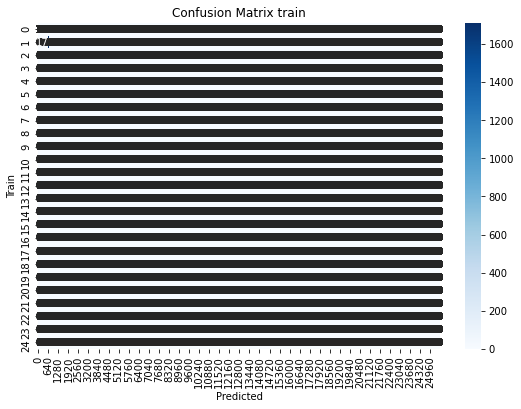

In [64]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_class, train_preds_class, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_SVCpolytrain_1.jpg')
plt.show()

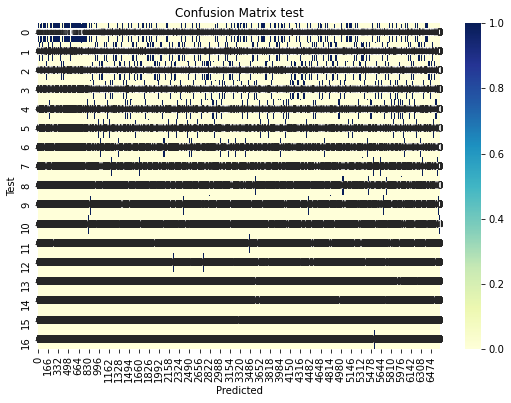

In [65]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_class, test_preds_class, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_SVCpolytest_1.jpg')
plt.show()

#### 3.4.2.3 Modelo SVM para variable _udsVenta_ categorizada por intervalos de igual tamaño.  
Se aborda en este apartado el algoritmo SVM donde la variable objetivo _udsVenta_ se ha categorizado según intervalos de igual longitud. El rango de valores [0, 196] se ha separado en 7, 14 y 25 intervalos.  

##### 3.4.2.3.1 Variable udsVenta discretizada en 7 intervalos de igual tamaño.

In [41]:
# Modelo clasificación para variable dependiente discreta
# SVC (versión del modelo SVM)
# Variable udsVenta categorizada en 7 clases

svm = SVC(kernel='poly', C=2, cache_size=100)

# Entrenamiento
svm.fit(x_train, y_train_2)

# Predicción del modelo
train_preds_2 = svm.predict(x_train)
test_preds_2 = svm.predict(x_test)

#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(train_preds_2, y_train_2))
print('RMSE in train:', np.sqrt(mean_squared_error(train_preds_2, y_train_2)))
print('MAE in test:', mean_absolute_error(test_preds_2, y_test_2))
print('RMSE in test:', np.sqrt(mean_squared_error(test_preds_2, y_test_2)))

MAE in train: 0.21178238873817729
RMSE in train: 0.5461004269996823
MAE in test: 0.2630783187178712
RMSE in test: 0.5822181082827443


In [43]:
# Precisión sobre train y test
score_train = svm.score(x_train, y_train_2)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = svm.score(x_test, y_test_2)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

El grado de precisión del modelo para el conjunto train es 0.8225.
El grado de precisión del modelo para el conjunto test es 0.7708.


In [51]:
# Precisión del modelo con el conjunto train y test

# b = cross_val_score(svm, x_train, y_train_2, cv=2).mean()
# print('La precisión del modelo aplicado al conjunto train, es:',round(b*100,2),'%')
# a = cross_val_score(svm, x_test, y_test_2, cv=2).mean()
# print('La precisión del modelo aplicado al conjunto test, es:',round(a*100,2),'%')

In [52]:
# Precisión, recall y f1 del modelo en conjunto train y test

accuracy_train = accuracy_score(y_train_2, train_preds_2, normalize = True)
accuracy_test = accuracy_score(y_test_2, test_preds_2, normalize = True)
print('Accuracy train: {}, Accuracy test: {}'.format(round(accuracy_train, 4), round(accuracy_test, 4)))

recall_train = recall_score(y_train_2, train_preds_2, average= 'weighted')
recall_test = recall_score(y_test_2, test_preds_2, average= 'weighted')
print('Recall train: {}, Recall test: {}'.format(round(recall_train, 4), round(recall_test, 4)))

f1_train = f1_score(y_train_2, train_preds_2, average= 'weighted')
f1_test = f1_score(y_test_2, test_preds_2, average= 'weighted')
print('F1 train: {}, F1 test: {}'.format(round(f1_train, 4), round(f1_test, 4)))

Accuracy train: 0.8225, Accuracy test: 0.7708
Recall train: 0.8225, Recall test: 0.7708
F1 train: 0.7424, F1 test: 0.671


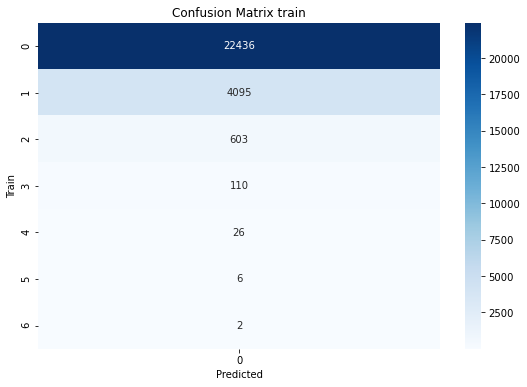

In [66]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_2, train_preds_2, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_SVCpolytrain_2.jpg')
plt.show()

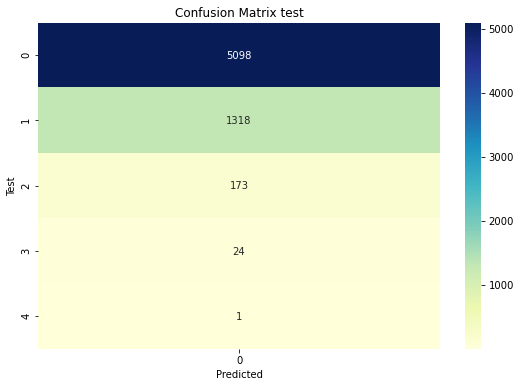

In [67]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_2, test_preds_2, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_SVCpolytest_2.jpg')
plt.show()

In [41]:
y_predict = pd.read_excel('data/y_predictsvm.xls')
test_preds_SVM3 = test_preds_3.astype(int)
y_predict['test_preds_3'] = test_preds_SVM3
y_predict.to_excel('data/y_predictsvm.xls')

#### 3.4.2.3.2 Variable udsVenta discretizada en 14 intervalos de igual tamaño.   
Se entrena en este ejemplo, la variable _udsVenta_ discretizada en 14 intervalos de igual tamaño.  

In [42]:
svm2 = SVC(kernel='poly', C=2, cache_size=100)

# Entrenamiento
svm2.fit(x_train, y_train_4)

# Predicción del modelo
train_preds_4 = svm2.predict(x_train)
test_preds_4 = svm2.predict(x_test)

#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(train_preds_4, y_train_4))
print('RMSE in train:', np.sqrt(mean_squared_error(train_preds_4, y_train_4)))
print('MAE in test:', mean_absolute_error(test_preds_4, y_test_4))
print('RMSE in test:', np.sqrt(mean_squared_error(test_preds_4, y_test_4)))

MAE in train: 0.7262262629225017
RMSE in train: 1.3161452936141886
MAE in test: 0.8826731176292713
RMSE in test: 1.4209329677861793


In [43]:
# Precisión sobre train y test
score_train = svm2.score(x_train, y_train_4)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = svm2.score(x_test, y_test_4)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

El grado de precisión del modelo para el conjunto train es 0.5693.
El grado de precisión del modelo para el conjunto test es 0.4806.


In [ ]:
# Precisión del modelo con el conjunto train y test

# b = cross_val_score(svm2, x_train, y_train_4, cv=2).mean()
# print('La precisión del modelo aplicado al conjunto train, es:',round(b*100,2),'%')
# a = cross_val_score(svm2, x_test, y_test_4, cv=2).mean()
# print('La precisión del modelo aplicado al conjunto test, es:',round(a*100,2),'%')

In [44]:
# Precisión, recall y f1 del modelo en conjunto train y test

accuracy_train = accuracy_score(y_train_4, train_preds_4, normalize = True)
accuracy_test = accuracy_score(y_test_4, test_preds_4, normalize = True)
print('Accuracy train: {}, Accuracy test: {}'.format(round(accuracy_train, 4), round(accuracy_test, 4)))

recall_train = recall_score(y_train_4, train_preds_4, average= 'weighted')
recall_test = recall_score(y_test_4, test_preds_4, average= 'weighted')
print('Recall train: {}, Recall test: {}'.format(round(recall_train, 4), round(recall_test, 4)))

f1_train = f1_score(y_train_4, train_preds_4, average= 'weighted')
f1_test = f1_score(y_test_4, test_preds_4, average= 'weighted')
print('F1 train: {}, F1 test: {}'.format(round(f1_train, 4), round(f1_test, 4)))

Accuracy train: 0.5693, Accuracy test: 0.4806
Recall train: 0.5693, Recall test: 0.4806
F1 train: 0.4131, F1 test: 0.3121


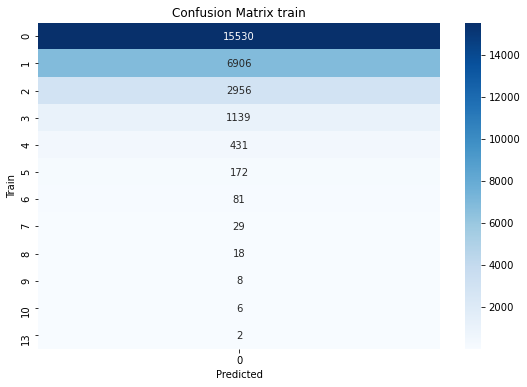

In [55]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_4, train_preds_4, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_SVCpolytrain_2.jpg')
plt.show()

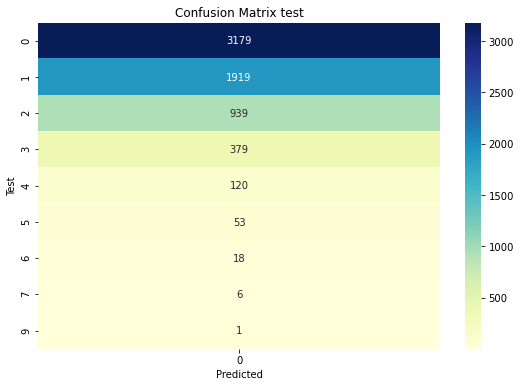

In [56]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_4, test_preds_4, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_SVCpolytest_2.jpg')
plt.show()

##### 3.4.2.3.3 Variable udsVenta discretizada en 25 clases, según valores únicos.  
En este apartado se aborda algoritmo SVM con la variable _udsVenta_ discretazada en 25 clases, según posibles valores únicos. 

In [34]:
svm3 = SVC(kernel='poly', C=2, cache_size=100)

# Entrenamiento
svm3.fit(x_train, y_train_3)

# Predicción del modelo
train_preds_3 = svm3.predict(x_train)
test_preds_3 = svm3.predict(x_test)

#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(train_preds_3, y_train_3))
print('RMSE in train:', np.sqrt(mean_squared_error(train_preds_3, y_train_3)))
print('MAE in test:', mean_absolute_error(test_preds_3, y_test_3))
print('RMSE in test:', np.sqrt(mean_squared_error(test_preds_3, y_test_3)))

MAE in train: 2.463523718747709
RMSE in train: 3.559678386225187
MAE in test: 2.8708799516177805
RMSE in test: 3.8677095938381822


In [37]:
# Precisión sobre train y test
score_train = svm3.score(x_train, y_train_3)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = svm3.score(x_test, y_test_3)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

El grado de precisión del modelo para el conjunto train es 0.3344.
El grado de precisión del modelo para el conjunto test es 0.2985.


In [38]:
# Precisión, recall y f1 del modelo en conjunto train y test

accuracy_train = accuracy_score(y_train_3, train_preds_3, normalize = True)
accuracy_test = accuracy_score(y_test_3, test_preds_3, normalize = True)
print('Accuracy train: {}, Accuracy test: {}'.format(round(accuracy_train, 4), round(accuracy_test, 4)))

recall_train = recall_score(y_train_3, train_preds_3, average= 'weighted')
recall_test = recall_score(y_test_3, test_preds_3, average= 'weighted')
print('Recall train: {}, Recall test: {}'.format(round(recall_train, 4), round(recall_test, 4)))

f1_train = f1_score(y_train_3, train_preds_3, average= 'weighted')
f1_test = f1_score(y_test_3, test_preds_3, average= 'weighted')
print('F1 train: {}, F1 test: {}'.format(round(f1_train, 4), round(f1_test, 4)))

Accuracy train: 0.3344, Accuracy test: 0.2985
Recall train: 0.3344, Recall test: 0.2985
F1 train: 0.1676, F1 test: 0.1372


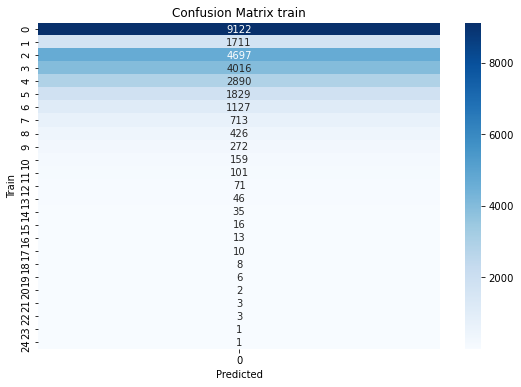

In [39]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_3, train_preds_3, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_SVCpolytrain_3.jpg')
plt.show()

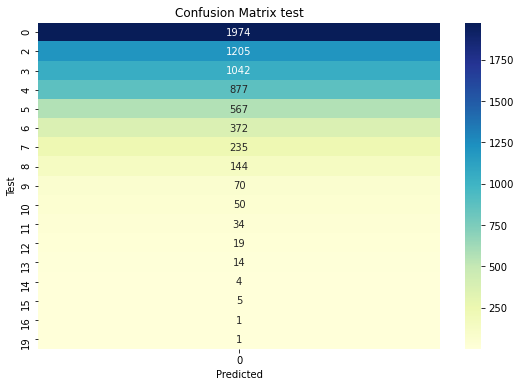

In [40]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_3, test_preds_3, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_SVCpolytest_3.jpg')
plt.show()

Se guardan las predicciones en fichero

In [70]:
# Predicciones de los diferentes modelos para el conjunto test.

test_preds_SVM4 = test_preds_4.astype(int)
test_preds_SVM3 = test_preds_3.astype(int)
test_preds_SVM2 = test_preds_2.astype(int)
test_preds_SVM1 = test_preds_class.astype(int)


# Unión de todas las predicciones en un único fichero.
y_predict =  np.column_stack((test_preds_SVM4, test_preds_SVM3, test_preds_SVM2, test_preds_SVM1))

# Transformación en dataframe
y_predict = pd.DataFrame(y_predict, columns=['test_preds_SVM4', 'test_preds_SVM3','test_preds_SVM2',
                                            'test_preds_SVM1'])

y_predict

,test_preds_SVM4,test_preds_SVM2,test_preds_SVM1
0,0,0,6164
1,0,0,6082
2,0,0,5616
3,0,0,5998
4,0,0,5941
5,0,0,6426
6,0,0,6406
7,0,0,6336
8,0,0,6214
9,0,0,5871


In [72]:
y_predict.to_excel('data/y_predictsvm.xls')

##### 3.4.2.4 Algoritmo SVC para variable categórica en días de venta.  
La variable dependiente _udsVenta_ tiene un elevado sesgo a la derecha, concentrando el 33% de las observaciones en el valor _udsVenta = 0_. Esto motiva que el modelo no sea eficaz en la predicción, asignando a la mayoría de las predicciones este valor. Se prueba de nuevo el algoritmo, pero prescindiendo de las observaciones en las que el establecimiento está cerrado (_bolOpen = 0), en las que el 100% de _udsVenta = 0_.  Se han eliminado 4.177 observaciones y _udsVenta = 0_ representa ahora el 23,35% de las observaciones.   
Se ha suavizado el sesgo en la distribución de frecuencias.  
La variable _udsVenta_ se ha categorizado por su valor, definiéndose un total de 25 clases.  

In [113]:
# Modelo clasificación para variable dependiente discreta en días abiertos
# SVC (versión del modelo SVM)
# Hiperplano lineal

svm = SVC(kernel='linear', C=10)

# Entrenamiento
svm.fit(x_train2, y_train2_3)

# Predicción del modelo
train_preds = svm.predict(x_train2)
test_preds = svm.predict(x_test2)

#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(train_preds, y_train2_3))
print('RMSE in train:', np.sqrt(mean_squared_error(train_preds, y_train2_3)))
print('MAE in test:', mean_absolute_error(test_preds, y_test2_3))
print('RMSE in test:', np.sqrt(mean_squared_error(test_preds, y_test2_3)))

MAE in train: 2.22742996962538
RMSE in train: 3.2393872518005487
MAE in test: 2.50923307270005
RMSE in test: 3.367201644391232


In [114]:
# Precisión, recall y f1 del modelo en conjunto train y test

accuracy_train = accuracy_score(y_train2_3, train_preds, normalize = True)
accuracy_test = accuracy_score(y_test2_3, test_preds, normalize = True)
print('Accuracy train: {}, Accuracy test: {}'.format(round(accuracy_train, 4), round(accuracy_test, 4)))

recall_train = recall_score(y_train2_3, train_preds, average= 'weighted')
recall_test = recall_score(y_test2_3, test_preds, average= 'weighted')
print('Recall train: {}, Recall test: {}'.format(round(recall_train, 4), round(recall_test, 4)))

f1_train = f1_score(y_train2_3, train_preds, average= 'weighted')
f1_test = f1_score(y_test2_3, test_preds, average= 'weighted')
print('F1 train: {}, F1 test: {}'.format(round(f1_train, 4), round(f1_test, 4)))

Accuracy train: 0.3151, Accuracy test: 0.2146
Recall train: 0.3151, Recall test: 0.2146
F1 train: 0.2338, F1 test: 0.1443


C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [115]:
# Matriz de confusión
confusion_matrix(y_test2_3, test_preds)

array([[618,   2, 699,  50,   2,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [533,   0, 608,  63,   1,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [439,   0, 539,  64,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [396,   0, 418,  62,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   1],
       [244,   0, 277,  46,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [153,   0, 199,  18,   2,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [ 95,   0, 120,  20,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0],
       [ 58,   0,  69,  14,   1,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0

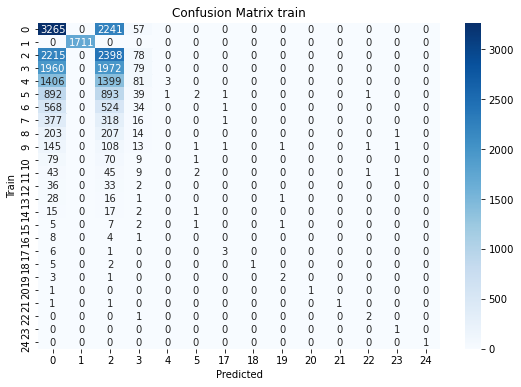

In [119]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train2_3, train_preds, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_SVCtrain2_3.jpg')
plt.show()

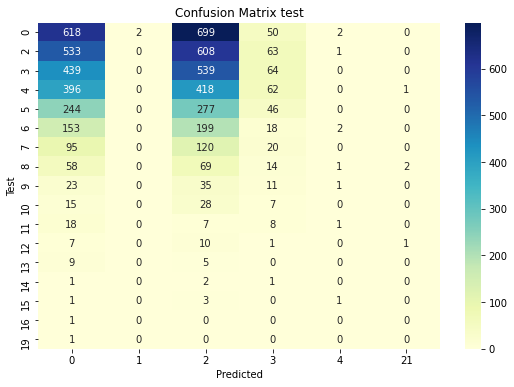

In [120]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test2_3, test_preds, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_SVCtest2_3.jpg')
plt.show()

### 3.4.3 Modelo Arbol de decisión  
Arbol de decisión es otro algoritmo de ML para clasificación. Se prueba en este apartado la precisión del algoritmo aplicado a diferentes discretizaciones de la variable udsVenta.  

#### 3.4.3.1 Árbol de decisión variable _udsVenta_ categorizada.   
Se aplica algoritmo para fichero completo con la variable _udsVenta_ categorizada por clases.

In [146]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_train_class = label_encoder.fit_transform(y_train_1)
y_test_class = label_encoder.fit_transform(y_test_1)

In [147]:
y_train_class.shape

(27278,)

In [148]:
# Se define el modelo Decision Tree simple
model_tree = DecisionTreeClassifier(max_depth=5, min_samples_split=2)

# Entrena el modelo para el conjunto train reducido a 2 dimensiones
model_tree.fit(x_train, y_train_class)

DecisionTreeClassifier(max_depth=5)

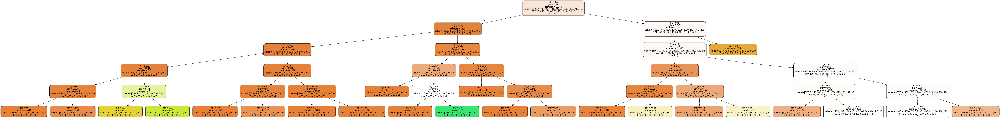

In [149]:
# Representación del árbol de decisión.
dot_data = StringIO()
export_graphviz(model_tree, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [151]:
# Precisión sobre train y test
score_train = model_tree.score(x_train, y_train_class)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_tree.score(x_test, y_test_class)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Matriz de confusión sobre train
y_predict_train = model_tree.predict(x_train)
y_predict_test = model_tree.predict(x_test)

El grado de precisión del modelo para el conjunto train es 0.4031.
El grado de precisión del modelo para el conjunto test es 0.2773.


In [155]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train, y_train_class))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train, y_train_class)))
print('MAE in test:', mean_absolute_error(y_predict_test, y_test_class))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test, y_test_class)))

MAE in train: 2.1176405894860326
RMSE in train: 3.1018999213272114
MAE in test: 1.8719383126700937
RMSE in test: 2.729709763252055


<module 'matplotlib.pyplot' from 'C:\\Users\\jh100\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

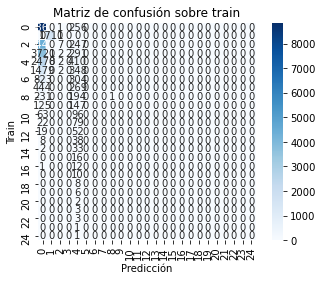

In [152]:
matrix_train = confusion_matrix(y_train_class, y_predict_train)
sns.heatmap(matrix_train, annot=True, fmt="d", cmap='Blues', square=True)
plt.xlabel("Predicción")
plt.ylabel("Train")
plt.title('Matriz de confusión sobre train')
# plt.savefig('graph/matriz confusion arbol decision.jpg')
plt

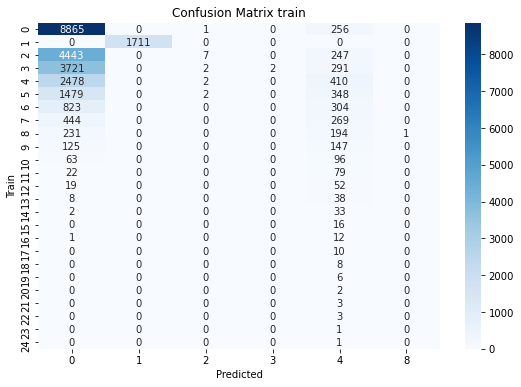

In [153]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_class, y_predict_train, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_DECISONTREEtrain_class.jpg')
plt.show()

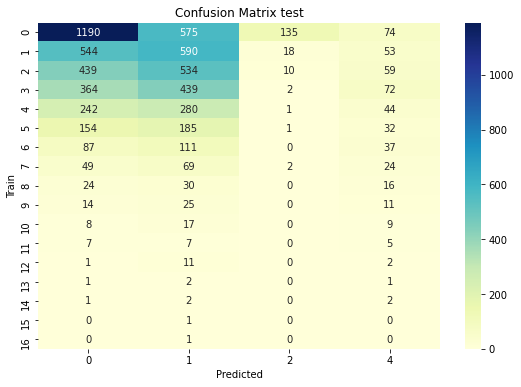

In [154]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_class, y_predict_test, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_DECISONTREEtest_class.jpg')
plt.show()

#### 3.4.3.2 Árbol decisión variable _udsVenta_ categorizada en 7 intervalos de igual tamaño.   
Previo al algoritmo, se obtienen mejores parámetros para configuración del modelo.

In [171]:
# Definición de los conjuntos parámetro
max_depth = [4, 5, 6, 7, 8, 9, 10]
min_samples_split = [2, 10, 20, 50, 100]

grid_tree = dict(max_depth=max_depth, min_samples_split=min_samples_split)
cv =  StratifiedKFold(n_splits=5, shuffle=True, random_state=15)

# Optimizar
tree_optimizer = GridSearchCV(estimator=DecisionTreeClassifier(),
                             param_grid=grid_tree,
                             n_jobs=-1,
                             scoring='accuracy',
                             refit = True,
                             cv=cv,
                             error_score=0)

grid_tree_optimizer = tree_optimizer.fit(x_train, y_train_2)

# Obtener la mejor combinación del clasificador SVM
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid_tree_optimizer.best_params_))
print ('Clases de clasificación del modelo {}.'.format(grid_tree_optimizer.classes_))

# Obtenemos la precisión del modelo
print('Precisión del modelo {}.'.format(round(grid_tree_optimizer.score(x_train, y_train_2),4)))

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


La mejor configuración de parámetros que maximiza la precisión es {'max_depth': 8, 'min_samples_split': 100}.
Clases de clasificación del modelo [0 1 2 3 4 5 6].
Precisión del modelo 0.8336.


In [121]:
# Se define el modelo Decision Tree simple para los mejores parámetros
model_tree2 = DecisionTreeClassifier(max_depth=8, min_samples_split=100)

# Entrena el modelo para el conjunto train.
model_tree2.fit(x_train, y_train_2)

DecisionTreeClassifier(max_depth=8, min_samples_split=100)

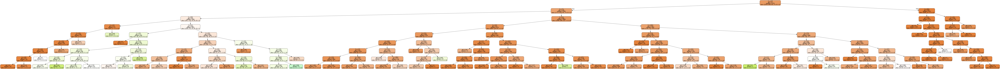

In [122]:
# Representación del árbol de decisión.
dot_data = StringIO()
export_graphviz(model_tree2, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [141]:
# Precisión sobre train y test
score_train = model_tree2.score(x_train, y_train_2)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_tree2.score(x_test, y_test_2)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Predicciones sobre conjunto train y test
y_predict_train = model_tree2.predict(x_train)
y_predict_test = model_tree2.predict(x_test)

El grado de precisión del modelo para el conjunto train es 0.8336.
El grado de precisión del modelo para el conjunto test es 0.7703.


In [142]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train, y_train_2))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train, y_train_2)))
print('MAE in test:', mean_absolute_error(y_predict_test, y_test_2))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test, y_test_2)))

MAE in train: 0.18450766185204193
RMSE in train: 0.4767103220391253
MAE in test: 0.2517387360145147
RMSE in test: 0.547004377434557


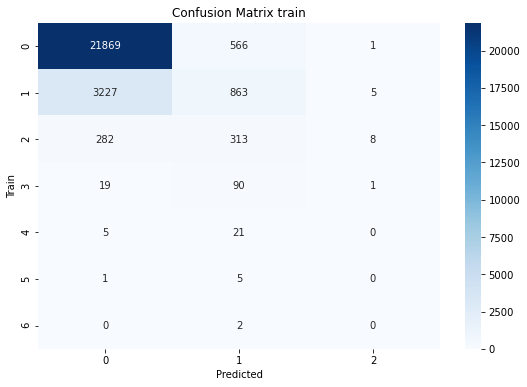

In [125]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_2, y_predict_train, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_DECISONTREEtrain_2.jpg')
plt.show()

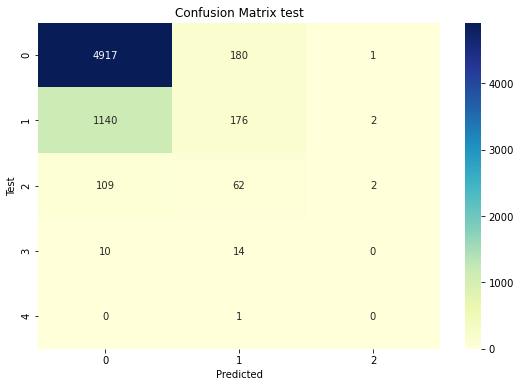

In [137]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_2, y_predict_test, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_DECISONTREEtest_2.jpg')
plt.show()

##### 3.4.3.3 Árbol decisión, variable _udsVenta_ categorizada en 25 clases.  
Se aplica algoritmo al modelo con variable udsVenta categorizada por clases. No se aplica filtro para sólo días de apertura.

In [172]:
# Optimizar
tree_optimizer = GridSearchCV(estimator=DecisionTreeClassifier(),
                             param_grid=grid_tree,
                             n_jobs=-1,
                             scoring='accuracy',
                             refit = True,
                             cv=cv,
                             error_score=0)

grid_tree_optimizer = tree_optimizer.fit(x_train, y_train_3)

# Obtener la mejor combinación del clasificador SVM
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid_tree_optimizer.best_params_))
print ('Clases de clasificación del modelo {}.'.format(grid_tree_optimizer.classes_))

# Obtenemos la precisión del modelo
print('Precisión del modelo {}.'.format(round(grid_tree_optimizer.score(x_train, y_train_3),4)))

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


La mejor configuración de parámetros que maximiza la precisión es {'max_depth': 8, 'min_samples_split': 100}.
Clases de clasificación del modelo [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24].
Precisión del modelo 0.4226.


In [68]:
# Se define el modelo Decision Tree simple para los mejores parámetros
model_tree3 = DecisionTreeClassifier(max_depth=8, min_samples_split=100)

# Entrena el modelo para el conjunto train reducido a días abierto
model_tree3.fit(x_train, y_train_3)

DecisionTreeClassifier(max_depth=8, min_samples_split=100)

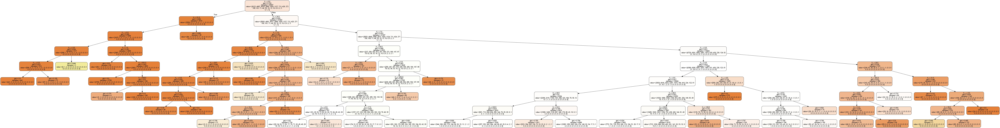

In [69]:
# Representación del árbol de decisión.
dot_data = StringIO()
export_graphviz(model_tree3, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [70]:
# Precisión sobre train y test
score_train = model_tree3.score(x_train, y_train_3)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_tree3.score(x_test, y_test_3)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Predicciones sobre conjunto train y test
y_predict_train3 = model_tree3.predict(x_train)
y_predict_test3 = model_tree3.predict(x_test)

El grado de precisión del modelo para el conjunto train es 0.385.
El grado de precisión del modelo para el conjunto test es 0.3057.


In [71]:
c = cross_val_score(model_tree3, x_train, y_train_3, cv=6).mean()
print('La precisión media del modelo aplicado al conjunto train, es:',round(c*100,2),'%')

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=6.
  % (min_groups, self.n_splits)), UserWarning)


La precisión media del modelo aplicado al conjunto train, es: 24.35 %


In [72]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train3, y_train_3))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train3, y_train_3)))
print('MAE in test:', mean_absolute_error(y_predict_test3, y_test_3))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test3, y_test_3)))

MAE in train: 1.4329800132983925
RMSE in train: 2.328676110694903
MAE in test: 1.7413063199274266
RMSE in test: 2.5944219198650753


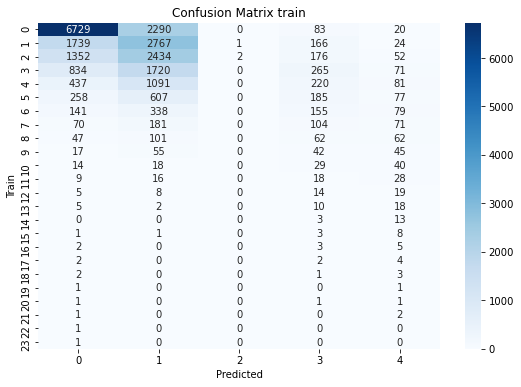

In [73]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_3, y_predict_train3, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_DECISONTREEtrain_3.jpg')
plt.show()

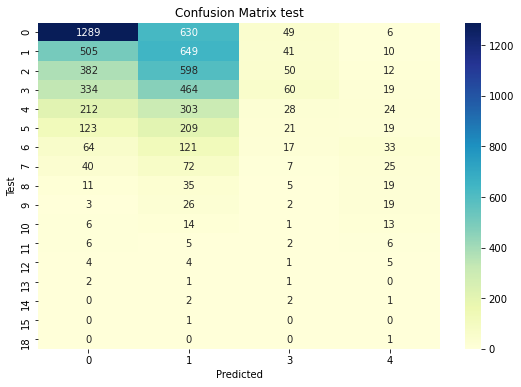

In [74]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_3, y_predict_test3, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_DECISONTREEtest_3.jpg')
plt.show()

In [130]:
y_predict = pd.read_excel('data/y_predictsvm.xls')
test_preds_Tree_3 = y_predict_test3.astype(int)
y_predict['test_preds_Tree_3'] = test_preds_Tree_3
y_predict.to_excel('data/y_predictsvm.xls')

#### 3.4.3.4 Árbol decisión para la modelo con variable _udsVenta_ categorizada en 14 intervalos de igual tamaño.

In [75]:
# Se define el modelo Decision Tree simple para los mejores parámetros
model_tree4 = DecisionTreeClassifier(max_depth=8, min_samples_split=100)

# Entrena el modelo para el conjunto train reducido a días abierto
model_tree4.fit(x_train, y_train_4)

DecisionTreeClassifier(max_depth=8, min_samples_split=100)

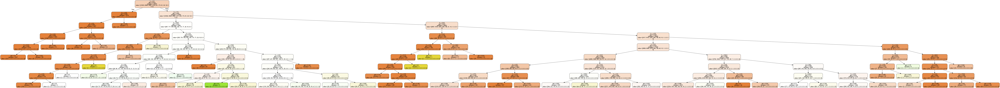

In [76]:
# Representación del árbol de decisión.
dot_data = StringIO()
export_graphviz(model_tree4, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [77]:
# Precisión sobre train y test
score_train = model_tree4.score(x_train, y_train_4)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_tree4.score(x_test, y_test_4)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Predicciones sobre conjunto train y test
y_predict_train4 = model_tree4.predict(x_train)
y_predict_test4 = model_tree4.predict(x_test)

El grado de precisión del modelo para el conjunto train es 0.5621.
El grado de precisión del modelo para el conjunto test es 0.4858.


In [78]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train4, y_train_4))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train4, y_train_4)))
print('MAE in test:', mean_absolute_error(y_predict_test4, y_test_4))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test4, y_test_4)))

MAE in train: 0.6443853404779599
RMSE in train: 1.1203448949039632
MAE in test: 0.7999697611127911
RMSE in test: 1.2745917837883927


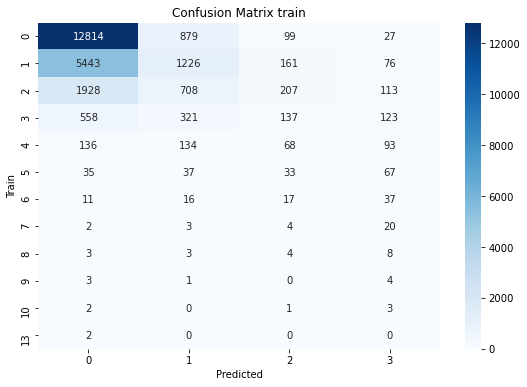

In [79]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_4, y_predict_train4, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_DECISONTREEtrain_4.jpg')
plt.show()

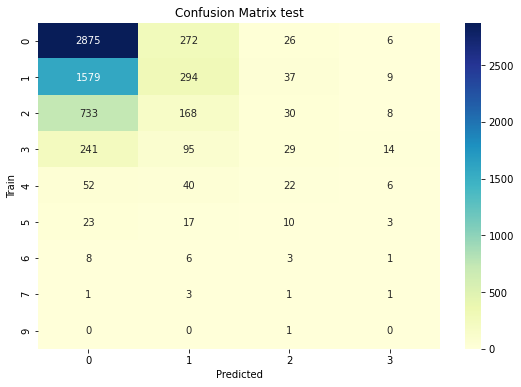

In [80]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_4, y_predict_test4, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_DECISONTREEtest_4.jpg')
plt.show()

In [129]:
y_predict = pd.read_excel('data/y_predictsvm.xls')
test_preds_Tree_4 = y_predict_test4.astype(int)
y_predict['test_preds_Tree_4'] = test_preds_Tree_4
y_predict.to_excel('data/y_predictsvm.xls')

##### 3.4.3.5 Árbol de decisión para la variable _udsVenta_ categorizada en 7 intervalos y bolOpen=1 (abierto).  
Por último, se prueba nuevamente para la variable categórica y_train2_2;  

  - udsVenta discretizada en intervalos de igual amplitud.
  - sólo días abiertos (bolOpen = 1).  

In [90]:
# Optimizar
tree_optimizer = GridSearchCV(estimator=DecisionTreeClassifier(),
                             param_grid=grid_tree,
                             n_jobs=-1,
                             scoring='accuracy',
                             refit = True,
                             cv=cv,
                             error_score=0)

grid_tree_optimizer = tree_optimizer.fit(x_train2, y_train2_2)

# Obtener la mejor combinación del clasificador.
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid_tree_optimizer.best_params_))
print ('Clases de clasificación del modelo {}.'.format(grid_tree_optimizer.classes_))

# Obtenemos la precisión del modelo
print('Precisión del modelo {}.'.format(round(grid_tree_optimizer.score(x_train2, y_train2_2),4)))

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


La mejor configuración de parámetros que maximiza la precisión es {'max_depth': 7, 'min_samples_split': 500}.
Clases de clasificación del modelo [0 1 2 3 4 5 6].
Precisión del modelo 0.7922.


In [91]:
# Se define el modelo Decision Tree simple para los mejores parámetros
model_tree6 = DecisionTreeClassifier(max_depth=7, min_samples_split=500)

# Entrena el modelo para el conjunto train reducido a días abierto
model_tree6.fit(x_train2, y_train2_2)

DecisionTreeClassifier(max_depth=7, min_samples_split=500)

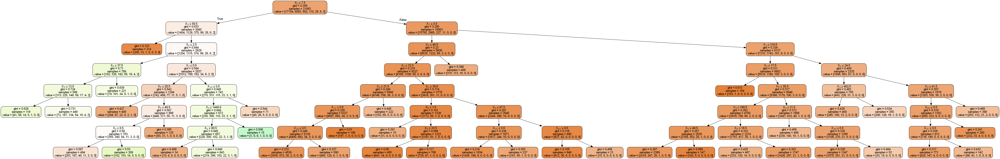

In [92]:
# Representación del árbol de decisión.
dot_data = StringIO()
export_graphviz(model_tree6, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [94]:
# Precisión sobre train y test
score_train = model_tree6.score(x_train2, y_train2_2)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_tree6.score(x_test2, y_test2_2)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Predicciones sobre conjunto train y test
y_predict_train6 = model_tree6.predict(x_train2)
y_predict_test6 = model_tree6.predict(x_test2)

El grado de precisión del modelo para el conjunto train es 0.7922.
El grado de precisión del modelo para el conjunto test es 0.7508.


In [95]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train6, y_train2_2))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train6, y_train2_2)))
print('MAE in test:', mean_absolute_error(y_predict_test6, y_test2_2))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test6, y_test2_2)))

MAE in train: 0.23107352339380713
RMSE in train: 0.5347047343275448
MAE in test: 0.27366494759607385
RMSE in test: 0.5723339311660045


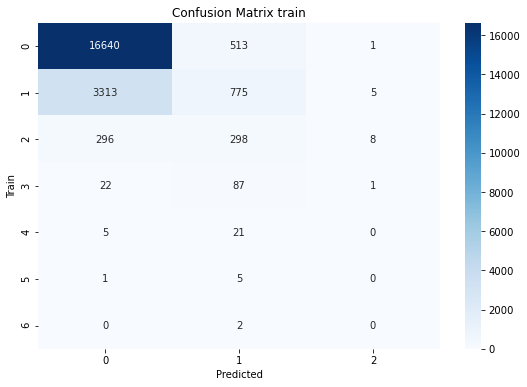

In [96]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train2_2, y_predict_train6, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_DECISONTREEtrain2_2.jpg')
plt.show()

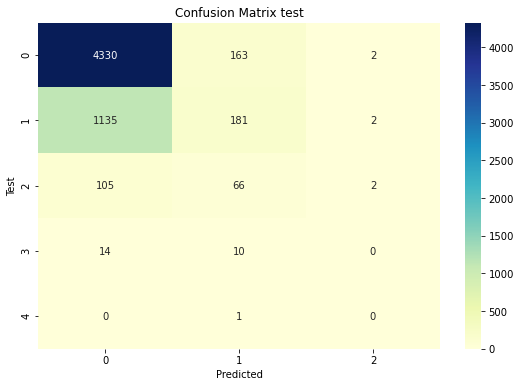

In [97]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test2_2, y_predict_test6, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_DECISONTREEtest2_2.jpg')
plt.show()

#### 3.4.3.6 Árbol decisión, para la variable _udsVenta_ categorizada en 24 clases y para días bolOpen = 1.   
Veamos a continuación el mejor modelo de árbol decisión, ahora sólo para días en que el establecimiento se encuentra abierto.  

In [81]:
# Definición de los conjuntos parámetro
max_depth = [4, 5, 6, 7, 8, 9, 10]
min_samples_split = [20, 50, 100, 500]

grid_tree = dict(max_depth=max_depth, min_samples_split=min_samples_split)
cv =  StratifiedKFold(n_splits=5, shuffle=True, random_state=15)

# Optimizar
tree_optimizer = GridSearchCV(estimator=DecisionTreeClassifier(),
                             param_grid=grid_tree,
                             n_jobs=-1,
                             scoring='accuracy',
                             refit = True,
                             cv=cv,
                             error_score=0)

grid_tree_optimizer = tree_optimizer.fit(x_train2, y_train2_3)

# Obtener la mejor combinación del clasificador SVM
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid_tree_optimizer.best_params_))
print ('Clases de clasificación del modelo {}.'.format(grid_tree_optimizer.classes_))

# Obtenemos la precisión del modelo
print('Precisión del modelo {}.'.format(round(grid_tree_optimizer.score(x_train2, y_train2_3),4)))

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


La mejor configuración de parámetros que maximiza la precisión es {'max_depth': 10, 'min_samples_split': 100}.
Clases de clasificación del modelo [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23].
Precisión del modelo 0.3051.


In [82]:
# Se define el modelo Decision Tree simple para los mejores parámetros
model_tree5 = DecisionTreeClassifier(max_depth=10, min_samples_split=100)

# Entrena el modelo para el conjunto train reducido a días abierto
model_tree5.fit(x_train2, y_train2_3)

DecisionTreeClassifier(max_depth=10, min_samples_split=100)

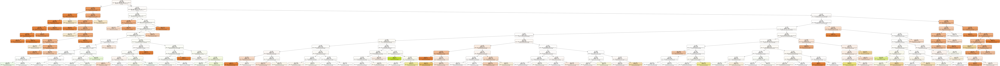

In [84]:
# Representación del árbol de decisión.
dot_data = StringIO()
export_graphviz(model_tree5, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [86]:
# Precisión sobre train y test
score_train = model_tree5.score(x_train2, y_train2_3)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_tree5.score(x_test2, y_test2_3)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Predicciones sobre conjunto train y test
y_predict_train5 = model_tree5.predict(x_train2)
y_predict_test5 = model_tree5.predict(x_test2)

El grado de precisión del modelo para el conjunto train es 0.3051.
El grado de precisión del modelo para el conjunto test es 0.2407.


In [87]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train5, y_train2_3))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train5, y_train2_3)))
print('MAE in test:', mean_absolute_error(y_predict_test5, y_test2_3))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test5, y_test2_3)))

MAE in train: 1.5955985995544038
RMSE in train: 2.3830438164515746
MAE in test: 1.8642488770587258
RMSE in test: 2.6208917118981834


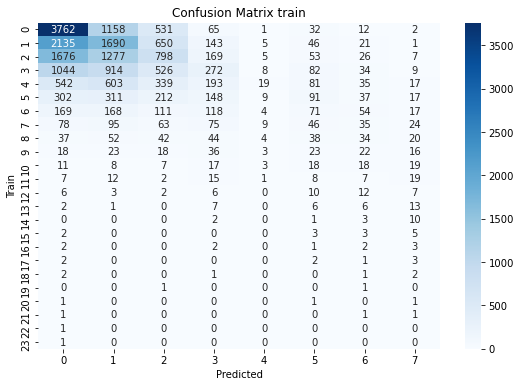

In [88]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train2_3, y_predict_train5, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_DECISONTREEtrain2_3.jpg')
plt.show()

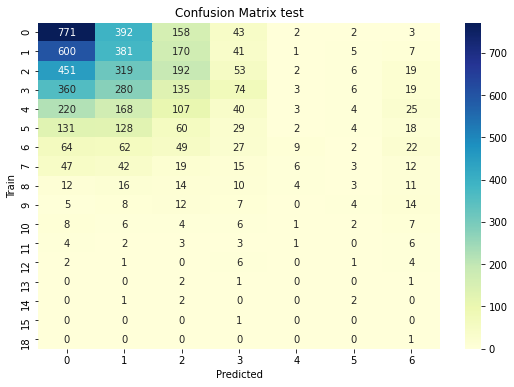

In [89]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test2_3, y_predict_test5, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_DECISONTREEtest2_3.jpg')
plt.show()

Se han probado diferentes combinaciones, y con el que mejor porcentaje de precisión se obtiene es con la variable udsVenta categorizada en intervalos de igual amplitud y sólo para días bolOpen = 1.  

#### 3.4.4 Algoritmo Gradiente Boosting Regressor.  
Este algoritmo combina algoritmo de árbol de decisión con regresión. Entre las diversas categorizaciones posibles, y activar el filtro de sólo dias abierto, la que mejor precisión ha dado en los anteriores algoritmos es;     
  - categorizar _udsVenta_ en 7 intervalos de igual tamaño.   
  - considerar todos los días.   

In [170]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.model_selection import cross_val_score

model_GBR = DecisionTreeRegressor(max_depth = 10,
                                   criterion = 'mse')
c = cross_val_score(model_GBR, x_train, y_train_2, cv=6).mean()
print('La precisión media del modelo aplicado al conjunto train, es:',round(c*100,2),'%')

La precisión media del modelo aplicado al conjunto train, es: 16.9 %


Se entrena el modelo para el conjunto completo y variable _udsVenta_ discretizada en 7 intervalos de igual tamaño.

In [104]:
# Definición de los conjuntos parámetro
max_depth = [4, 5, 6, 7, 8, 9, 10]
min_samples_split = [20, 50, 100, 500]

grid_tree = dict(max_depth=max_depth, min_samples_split=min_samples_split)
cv =  StratifiedKFold(n_splits=5, shuffle=True, random_state=15)

# Optimizar
GBR_optimizer = GridSearchCV(estimator=DecisionTreeRegressor(),
                             param_grid=grid_tree,
                             n_jobs=-1,
                             scoring='accuracy',
                             refit = True,
                             cv = 7,
                             error_score=0)

grid_GBR_optimizer = GBR_optimizer.fit(x_train, y_train_2)

# Obtener la mejor combinación del clasificador GBR
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid_GBR_optimizer.best_params_))

La mejor configuración de parámetros que maximiza la precisión es {'max_depth': 4, 'min_samples_split': 20}.


In [107]:
model_GBR = DecisionTreeRegressor(max_depth = 4,
                                   min_samples_split = 20,
                                   criterion = 'mse')

# Entrena el modelo para el conjunto train reducido a días abierto
model_GBR.fit(x_train, y_train_2)

DecisionTreeRegressor(max_depth=4, min_samples_split=20)

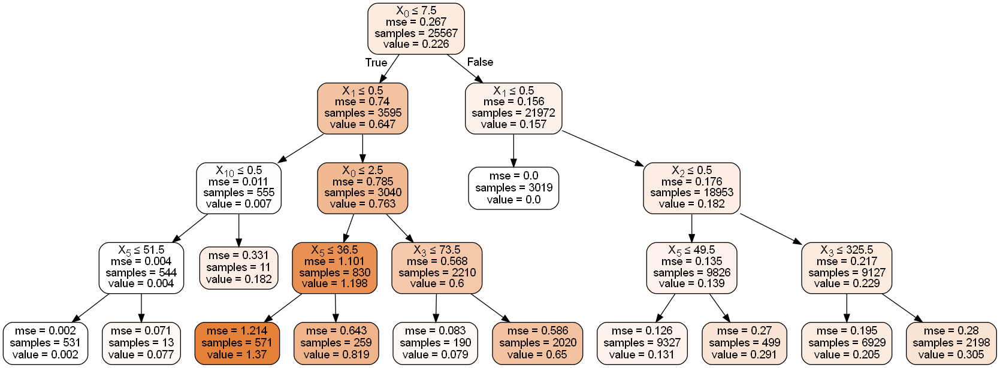

In [108]:
# Representación del árbol de decisión.
dot_data = StringIO()
export_graphviz(model_GBR, out_file = dot_data,
                filled = True, rounded = True,
                special_characters = True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [109]:
# Precisión sobre train y test
score_train = model_GBR.score(x_train, y_train_2)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = model_GBR.score(x_test, y_test_2)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Predicciones sobre conjunto train y test
y_predict_train_GBR = model_GBR.predict(x_train)
y_predict_test_GBR = model_GBR.predict(x_test)

El grado de precisión del modelo para el conjunto train es 0.218.
El grado de precisión del modelo para el conjunto test es 0.076.


In [110]:
c = cross_val_score(model_GBR, x_train, y_train_2, cv=4).mean()
print('La precisión media del modelo aplicado al conjunto train, es:',round(c*100,2),'%')

La precisión media del modelo aplicado al conjunto train, es: -3.22 %


In [111]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train_GBR, y_train_2))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train_GBR, y_train_2)))
print('MAE in test:', mean_absolute_error(y_predict_test_GBR, y_test_2))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test_GBR, y_test_2)))

MAE in train: 0.2985134322050615
RMSE in train: 0.45704535367121785
MAE in test: 0.3510714736566469
RMSE in test: 0.499257327976119


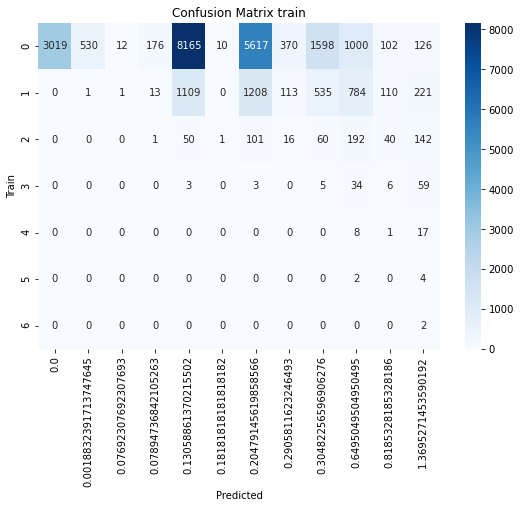

In [112]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_2, y_predict_train_GBR, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_GBRtrain_2.jpg')
plt.show()

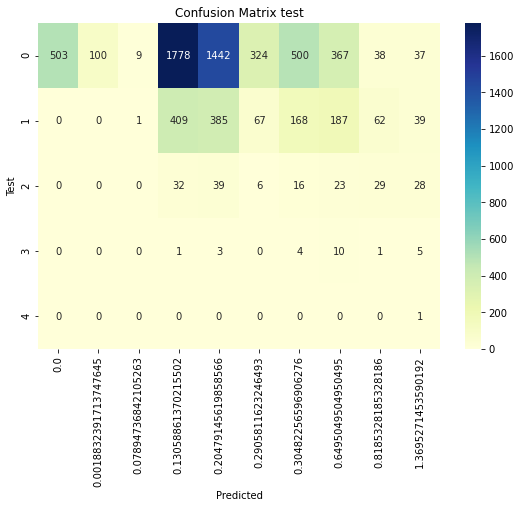

In [113]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_2, y_predict_test_GBR, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_GBRtest_2.jpg')
plt.show()

In [126]:
y_predict = pd.read_excel('data/y_predictsvm.xls')
test_preds_GradientBoosting = y_predict_test_GBR.astype(int)
y_predict['test_preds_GradientBoosting'] = test_preds_GradientBoosting
y_predict.to_excel('data/y_predictsvm.xls')

#### 3.4.5 Algoritmo Arbol de Decisión de Gradiente Creciente (XGBoost).  
Se aborda en este apartado el diseño de un modelo de predicción de la demanda a partir de algoritmo Gradiente Boosting Classifier, basado en árbol de decisión mejorado mediante sistema boosting.  
Al igual que en el algoritmo GBR, se entrena con el fichero de _udsVenta_ categorizado en 7 intervalos de igual tamaño, y sin filtro en bolOpen.   

In [114]:
# Definición de los conjuntos parámetro
max_depth = [4, 5, 6, 7, 8, 9, 10]
min_samples_split = [20, 50, 100, 500]

grid_tree = dict(max_depth=max_depth, min_samples_split=min_samples_split)
cv =  StratifiedKFold(n_splits=5, shuffle=True, random_state=15)

# Optimizar
tree_optimizer = GridSearchCV(estimator=GradientBoostingClassifier(),
                             param_grid=grid_tree,
                             n_jobs=-1,
                             scoring='accuracy',
                             refit = True,
                             cv=cv,
                             error_score=0)

grid_tree_optimizer = tree_optimizer.fit(x_train, y_train_2)

# Obtener la mejor combinación del clasificador XGBoost
print ('La mejor configuración de parámetros que maximiza la precisión es {}.'.format(grid_tree_optimizer.best_params_))
print ('Clases de clasificación del modelo {}.'.format(grid_tree_optimizer.classes_))

# Obtenemos la precisión del modelo
print('Precisión del modelo {}.'.format(round(grid_tree_optimizer.score(x_train, y_train_2),4)))

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


La mejor configuración de parámetros que maximiza la precisión es {'max_depth': 5, 'min_samples_split': 100}.
Clases de clasificación del modelo [0 1 2 3 4 5 6].
Precisión del modelo 0.8443.


In [115]:
model_boosting = GradientBoostingClassifier(n_estimators=7,
                                            max_depth=5,
                                            min_samples_split = 100,
                                            learning_rate=0.01,
                                            criterion='mse')
c = cross_val_score(model_boosting, x_train, y_train_2, cv=7).mean()
print('La precisión media del modelo aplicado al conjunto train, es:',round(c*100,2),'%')

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


La precisión media del modelo aplicado al conjunto train, es: 79.88 %


In [119]:
b = cross_val_score(model_boosting, x_test, y_test_2, cv=7).mean()
print('La precisión media del modelo aplicado al conjunto test, es:',round(b*100,2),'%')

C:\Users\jh100\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:668: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=7.
  % (min_groups, self.n_splits)), UserWarning)


La precisión media del modelo aplicado al conjunto test, es: 77.08 %


In [116]:
gradient_boosting = model_boosting.fit(x_train, y_train_2)

In [117]:
# Precisión sobre train y test
score_train = gradient_boosting.score(x_train, y_train_2)
print('El grado de precisión del modelo para el conjunto train es {}.'.format(round(score_train,4)))
score_test = gradient_boosting.score(x_test, y_test_2)
print('El grado de precisión del modelo para el conjunto test es {}.'.format(round(score_test,4)))

# Predicciones sobre conjunto train y test
y_predict_train_boosting = gradient_boosting.predict(x_train)
y_predict_test_boosting = gradient_boosting.predict(x_test)

El grado de precisión del modelo para el conjunto train es 0.8106.
El grado de precisión del modelo para el conjunto test es 0.7708.


In [120]:
#Vemos el error del algoritmo a la hora de predecir, para comprobar si a ajustado bien.
print('MAE in train:', mean_absolute_error(y_predict_train_boosting, y_train_2))
print('RMSE in train:', np.sqrt(mean_squared_error(y_predict_train_boosting, y_train_2)))
print('MAE in test:', mean_absolute_error(y_predict_test_boosting, y_test_2))
print('RMSE in test:', np.sqrt(mean_squared_error(y_predict_test_boosting, y_test_2)))

MAE in train: 0.22595533304650525
RMSE in train: 0.5640776507199807
MAE in test: 0.2630783187178712
RMSE in test: 0.5822181082827443


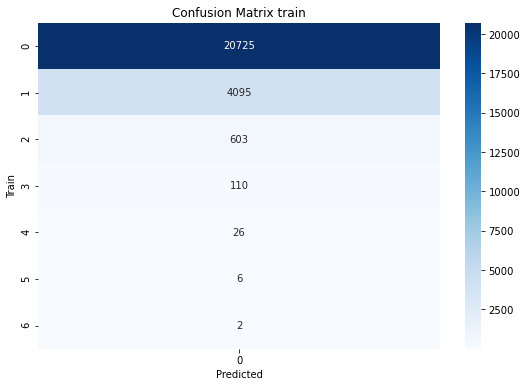

In [123]:
# Representación gráfica de la matriz de confusión sobre el conjunto train.
confusion_matrix_table = pd.crosstab(y_train_2, y_predict_train_boosting, rownames=['Train'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="Blues", fmt='g')
plt.title("Confusion Matrix train")
plt.savefig('graph/matriz_confusion_XGBoosttrain_2.jpg')
plt.show()

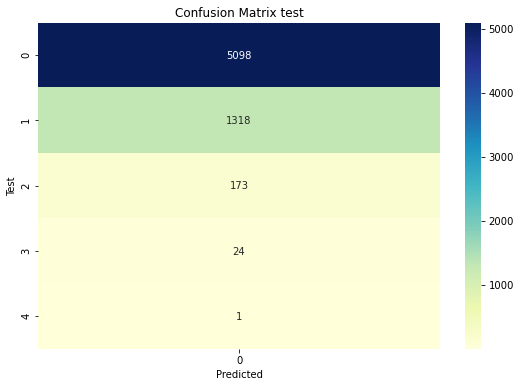

In [124]:
# Representación gráfica de la matriz de confusión sobre el conjunto test.
confusion_matrix_table = pd.crosstab(y_test_2, y_predict_test_boosting, rownames=['Test'], colnames=['Predicted'])
plt.figure(1, figsize=(9, 6))
sn.heatmap(confusion_matrix_table, annot=True, cmap="YlGnBu", fmt='g')
plt.title("Confusion Matrix test")
plt.savefig('graph/matriz_confusion_XGBoosttest_2.jpg')
plt.show()

In [127]:
y_predict = pd.read_excel('data/y_predictsvm.xls')
test_preds_XGBoost = y_predict_test_boosting.astype(int)
y_predict['test_preds_XGBoosting'] = test_preds_XGBoost
y_predict.to_excel('data/y_predictsvm.xls')

### 3.4.6 Algoritmo redes neuronales.  
Vease ahora otros algoritmos de Machine Learning aplicando redes neuronales. Se entrena el modelo para la variable _udsVenta_ discretizada en 24 intervalos de igual tamaño. 

Se implementa red neuronal con una última capa de salida con 24 categorías, una por cada uno de las clases de la variable y_train_3.  
 - 4 capas ocultas con 64, 32, 10, 8 neuronas   
 - Función de activación ReLU   

In [71]:
# Número de clases
num_classes = 24

model_neuronal = Sequential()

# Añadir las capas indicadas
model_neuronal.add(Dense(64, input_shape=(44,), activation="relu", kernel_initializer="random_normal", bias_initializer="zeros"))
model_neuronal.add(Dense(32, activation="relu"))
model_neuronal.add(Dense(10, activation="relu"))
model_neuronal.add(Dense(8, activation="relu"))
model_neuronal.add(Dense(num_classes, activation="softmax"))

Se compila el modelo con la función de pérdida más adecuada. La función de pérdida idónea es la Categorical-Crossentropy, dado que se generan salidas para cada clase de la variable objeto _udsVenta_.  

In [61]:
ohe = OneHotEncoder ()
y_train_transf = pd.get_dummies(y_train_3, columns=['udsVenta'], prefix='udsVenta')
y_test_transf = pd.get_dummies(y_test_3, columns=['udsVenta'], prefix='udsVenta')

In [72]:
# Se compila el modelo con la función de perdida más adecuada. 
model_neuronal.compile(optimizer=Adam(lr=0.01), loss='categorical_crossentropy', metrics=['accuracy', 'mse'])

In [73]:
batch = x_train.shape[0]
history = model_neuronal.fit(
    x_train, y_train_transf,
    validation_data=(x_test, y_test_transf),
    epochs=200,
    batch_size=batch,
    verbose=2)

Train on 25567 samples, validate on 6614 samples
Epoch 1/200
 - 1s - loss: 6.1169 - accuracy: 7.8226e-04 - mse: 0.0525 - val_loss: 3.1770 - val_accuracy: 0.0414 - val_mse: 0.0400
Epoch 2/200
 - 0s - loss: 3.1757 - accuracy: 0.0417 - mse: 0.0400 - val_loss: 3.1343 - val_accuracy: 0.0827 - val_mse: 0.0398
Epoch 3/200
 - 0s - loss: 3.1408 - accuracy: 0.0698 - mse: 0.0398 - val_loss: 3.1084 - val_accuracy: 0.0709 - val_mse: 0.0397
Epoch 4/200
 - 0s - loss: 3.1148 - accuracy: 0.0591 - mse: 0.0397 - val_loss: 3.1173 - val_accuracy: 0.0017 - val_mse: 0.0402
Epoch 5/200
 - 0s - loss: 3.0902 - accuracy: 3.1290e-04 - mse: 0.0401 - val_loss: 3.0642 - val_accuracy: 0.1607 - val_mse: 0.0395
Epoch 6/200
 - 0s - loss: 3.0721 - accuracy: 0.1449 - mse: 0.0395 - val_loss: 3.0426 - val_accuracy: 0.2303 - val_mse: 0.0393
Epoch 7/200
 - 0s - loss: 3.0437 - accuracy: 0.2474 - mse: 0.0394 - val_loss: 3.0328 - val_accuracy: 0.2546 - val_mse: 0.0392
Epoch 8/200
 - 0s - loss: 3.0099 - accuracy: 0.3056 - mse: 0.

Epoch 66/200
 - 0s - loss: 2.0388 - accuracy: 0.2248 - mse: 0.0337 - val_loss: 2.1065 - val_accuracy: 0.2351 - val_mse: 0.0341
Epoch 67/200
 - 0s - loss: 2.0276 - accuracy: 0.2310 - mse: 0.0336 - val_loss: 2.0991 - val_accuracy: 0.2410 - val_mse: 0.0341
Epoch 68/200
 - 0s - loss: 2.0159 - accuracy: 0.2391 - mse: 0.0335 - val_loss: 2.0926 - val_accuracy: 0.2454 - val_mse: 0.0341
Epoch 69/200
 - 0s - loss: 2.0025 - accuracy: 0.2548 - mse: 0.0334 - val_loss: 2.0872 - val_accuracy: 0.2563 - val_mse: 0.0341
Epoch 70/200
 - 0s - loss: 1.9868 - accuracy: 0.2739 - mse: 0.0333 - val_loss: 2.0834 - val_accuracy: 0.2985 - val_mse: 0.0341
Epoch 71/200
 - 0s - loss: 1.9699 - accuracy: 0.3568 - mse: 0.0332 - val_loss: 2.0875 - val_accuracy: 0.2985 - val_mse: 0.0343
Epoch 72/200
 - 0s - loss: 1.9610 - accuracy: 0.3568 - mse: 0.0333 - val_loss: 2.0746 - val_accuracy: 0.2985 - val_mse: 0.0343
Epoch 73/200
 - 0s - loss: 1.9474 - accuracy: 0.3568 - mse: 0.0332 - val_loss: 2.0437 - val_accuracy: 0.2985 - 

Epoch 131/200
 - 0s - loss: 1.7908 - accuracy: 0.3568 - mse: 0.0317 - val_loss: 1.9095 - val_accuracy: 0.2985 - val_mse: 0.0329
Epoch 132/200
 - 0s - loss: 1.8185 - accuracy: 0.3568 - mse: 0.0320 - val_loss: 1.9130 - val_accuracy: 0.2985 - val_mse: 0.0329
Epoch 133/200
 - 0s - loss: 1.8254 - accuracy: 0.3568 - mse: 0.0321 - val_loss: 1.9080 - val_accuracy: 0.2985 - val_mse: 0.0329
Epoch 134/200
 - 0s - loss: 1.8066 - accuracy: 0.3568 - mse: 0.0319 - val_loss: 1.9184 - val_accuracy: 0.2985 - val_mse: 0.0332
Epoch 135/200
 - 0s - loss: 1.7848 - accuracy: 0.3568 - mse: 0.0317 - val_loss: 1.9833 - val_accuracy: 0.2985 - val_mse: 0.0342
Epoch 136/200
 - 0s - loss: 1.8047 - accuracy: 0.3568 - mse: 0.0320 - val_loss: 1.9503 - val_accuracy: 0.2985 - val_mse: 0.0337
Epoch 137/200
 - 0s - loss: 1.7879 - accuracy: 0.3568 - mse: 0.0318 - val_loss: 1.9058 - val_accuracy: 0.2985 - val_mse: 0.0331
Epoch 138/200
 - 0s - loss: 1.7803 - accuracy: 0.3568 - mse: 0.0316 - val_loss: 1.8939 - val_accuracy: 0

Epoch 196/200
 - 0s - loss: 1.7328 - accuracy: 0.3568 - mse: 0.0306 - val_loss: 1.8862 - val_accuracy: 0.2985 - val_mse: 0.0328
Epoch 197/200
 - 0s - loss: 1.7326 - accuracy: 0.3568 - mse: 0.0306 - val_loss: 1.8694 - val_accuracy: 0.2985 - val_mse: 0.0325
Epoch 198/200
 - 0s - loss: 1.7268 - accuracy: 0.3568 - mse: 0.0305 - val_loss: 1.8611 - val_accuracy: 0.2985 - val_mse: 0.0324
Epoch 199/200
 - 0s - loss: 1.7259 - accuracy: 0.3568 - mse: 0.0304 - val_loss: 1.8702 - val_accuracy: 0.2985 - val_mse: 0.0325
Epoch 200/200
 - 0s - loss: 1.7211 - accuracy: 0.3568 - mse: 0.0303 - val_loss: 1.8756 - val_accuracy: 0.2985 - val_mse: 0.0326


In [74]:
model_neuronal.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 64)                2880      
_________________________________________________________________
dense_27 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_28 (Dense)             (None, 10)                330       
_________________________________________________________________
dense_29 (Dense)             (None, 8)                 88        
_________________________________________________________________
dense_30 (Dense)             (None, 24)                216       
Total params: 5,594
Trainable params: 5,594
Non-trainable params: 0
_________________________________________________________________


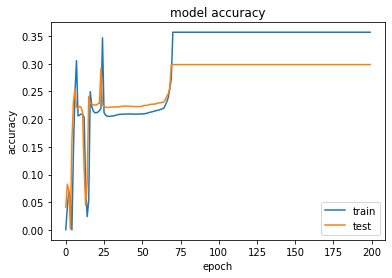

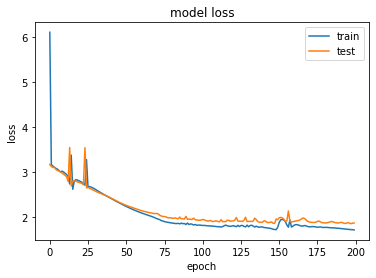

In [75]:
%matplotlib inline

# Visualizamos la evolución de la accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

# Visualizamos la evolución del error cometido por la red
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()